In [62]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import nltk
nltk.download('wordnet')
from nltk.tokenize import RegexpTokenizer
from nltk.stem import WordNetLemmatizer
from nltk.stem.snowball import SnowballStemmer, PorterStemmer
from nltk.corpus import stopwords
import re

from sklearn.feature_extraction.text import CountVectorizer
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

[nltk_data] Downloading package wordnet to /home/sanju/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [2]:
#inporting sql alchemy to run sql commands in jupyter

import sqlalchemy as db
from sqlalchemy import create_engine
engine = create_engine('sqlite://', echo=False)

In [3]:
depression = pd.read_csv('./data/depression.csv')
suicide_watch = pd.read_csv('./data/suicide_watch.csv')

In [4]:
# selecting only relevent columns
depression_columns = depression[["title", "selftext", "author",  "num_comments", "is_suicide","url"]]
suicide_columns = suicide_watch[["title", "selftext", "author",  "num_comments", "is_suicide","url"]]

In [5]:
#combining the depression and suicide databases

combined_data = pd.concat([depression_columns,suicide_columns],axis=0, ignore_index=True)    

In [6]:
combined_data.head()

,title,selftext,author,num_comments,is_suicide,url
0,Our most-broken and least-understood rules is ...,We understand that most people who reply immed...,SQLwitch,175,0,https://www.reddit.com/r/depression/comments/d...
1,"Regular Check-In Post, with important reminder...",Welcome to /r/depression's check-in post - a p...,SQLwitch,1984,0,https://www.reddit.com/r/depression/comments/m...
2,I just tried to kill myself and my family didn...,I tried to hang myself and it happened like th...,untitled_HumanBeing,27,0,https://www.reddit.com/r/depression/comments/o...
3,my body feels like i'm 80,i'm in my 30s but my body feels like im 80. it...,elaapvy,10,0,https://www.reddit.com/r/depression/comments/o...
4,Nsfw : I only have two moods,1) I want to have sex.\n2) I want to die\n\nED...,cherryboom0,141,0,https://www.reddit.com/r/depression/comments/o...


In [7]:
combined_data.to_sql('combined', con=engine)

In [8]:
combined_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1966 entries, 0 to 1965
Data columns (total 6 columns):
title           1966 non-null object
selftext        1902 non-null object
author          1966 non-null object
num_comments    1966 non-null int64
is_suicide      1966 non-null int64
url             1966 non-null object
dtypes: int64(2), object(4)
memory usage: 92.2+ KB


In [16]:
engine.execute("SELECT COUNT(*) from combined WHERE selftext IS NULL").fetchall()  #64 null posts

[(64,)]

In [20]:
# replacing null posts by emptypost
combined_data["selftext"].fillna("emptypost",inplace=True)

### DATA PREPROCESSING

In [64]:
#stopwords.words('english')

In [22]:
def processing_text(series_to_process):
    new_list = []
    tokenizer = RegexpTokenizer(r'(\w+)')
    lemmatizer = WordNetLemmatizer()
    for i in range(len(series_to_process)):
        dirty_string = (series_to_process)[i].lower()
        words_only = tokenizer.tokenize(dirty_string)
        words_only_stem = [lemmatizer.lemmatize(i) for i in words_only]
        words_without_stop = [i for i in words_only_stem if i not in stopwords.words('english')]
        long_string_clean = ' '.join(word for word in words_without_stop)
        new_list.append(long_string_clean)
    return new_list

In [23]:
# adding setftext_clean and title_clean as cleaned versions of the selftext and title.
combined_data["selftext_clean"] = processing_text(combined_data["selftext"])
combined_data["title_clean"] = processing_text(combined_data["title"])

In [24]:
combined_data.to_sql('combined_cleaned', con=engine)

In [26]:
suicide_posts = combined_data[combined_data["is_suicide"] ==1]["selftext_clean"]
suicide_titles = combined_data[combined_data["is_suicide"] ==1]["title_clean"]
suicide_authors = combined_data[combined_data["is_suicide"] ==1]["author"]

depression_posts = combined_data[combined_data["is_suicide"] ==0]["selftext_clean"]
depression_titles = combined_data[combined_data["is_suicide"] ==0]["title_clean"]
depression_authors = combined_data[combined_data["is_suicide"] ==0]["author"]

In [30]:
#DEFINING A FUNCTION TO VISUALISE MOST USED WORDS
def plot_most_used_words(category_string, data_series, palette, image_mask):
    #CHECKING OUT COMMON WORDS IN r/SuicideWatch USING CVEC
    cvec = CountVectorizer(stop_words='english')
    cvec.fit(data_series)
    #CREATING A DATAFRAME OF EXTRACTED WORDS
    created_df = pd.DataFrame(cvec.transform(data_series).todense(),
                              columns=cvec.get_feature_names())
    total_words = created_df.sum(axis=0)
    
    #<<<WORDCLOUD>>>
    #CREATING A LONG STRING OF WORDS FOR THE WORD CLOUD MODULE
    top_40_words = total_words.sort_values(ascending = False).head(40)
    top_40_words_df = pd.DataFrame(top_40_words)
    top_words_cloud_df = top_40_words_df.reset_index()
    top_words_cloud_df.columns = ["words", "count"]
    one_string_list = []
    for i in range(len(top_words_cloud_df)):
        one_string = (top_words_cloud_df["words"][i] + " ")* top_words_cloud_df["count"][i]
        one_string_list.append(one_string)
    long_string = " ".join(string for string in one_string_list)
    #print(long_string)
    # CREATING A WORD CLOUD IMAGE
    mask = np.array(Image.open(image_mask))
    wordcloud = WordCloud(repeat=True, collocations=False,min_font_size=2, max_font_size= 80, max_words= 1000, background_color= "white",colormap= palette,  mask= mask).generate(long_string)
    # DISPLAY IT
    #image_colors = ImageColorGenerator(mask)
    #plt.imshow(wordcloud.recolor(color_func=image_colors), interpolation='bilinear')
    #plt.axis("off")
    plt.figure(figsize = (20, 5), dpi=300)
    plt.title('\nTop Words used in {}\n'.format(category_string), fontsize=22)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()
    
    #<<<BARPLOT>>>
    #CREATING A FINAL DATAFRAME OF THE TOP 20 WORDS
    top_20_words = total_words.sort_values(ascending = False).head(20)
    top_20_words_df = pd.DataFrame(top_20_words, columns = ["count"])
    #PLOTTING THE COUNT OF THE TOP 20 WORDS
    sns.set_style("white")
    plt.figure(figsize = (15, 8), dpi=300)
    ax = sns.barplot(y= top_20_words_df.index, x="count", data=top_20_words_df, palette = palette)
    
    plt.xlabel("Count", fontsize=9)
    plt.ylabel('Common Words in {}'.format(category_string), fontsize=9)
    plt.yticks(rotation=-5)

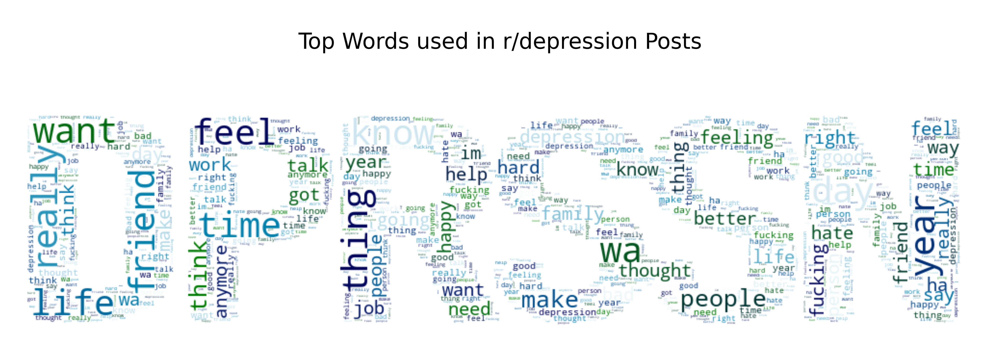

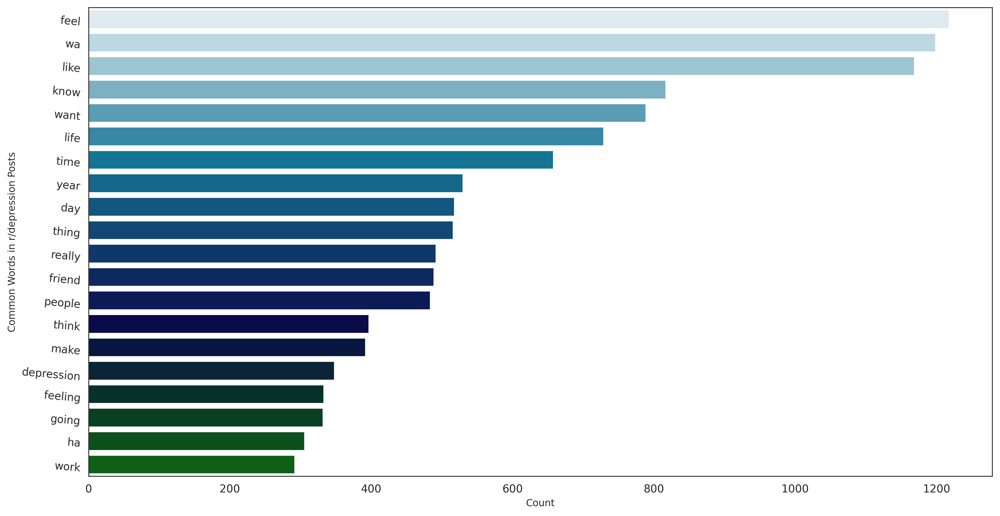

In [31]:
plot_most_used_words("r/depression Posts", depression_posts, palette="ocean_r", image_mask="./assets/depression_mask.png")

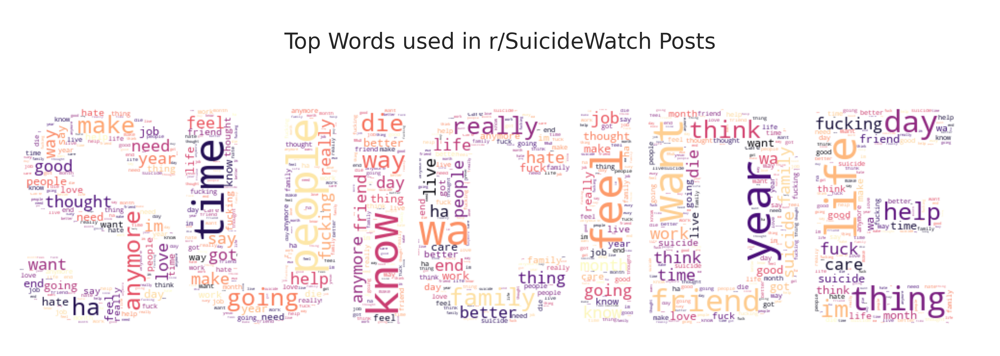

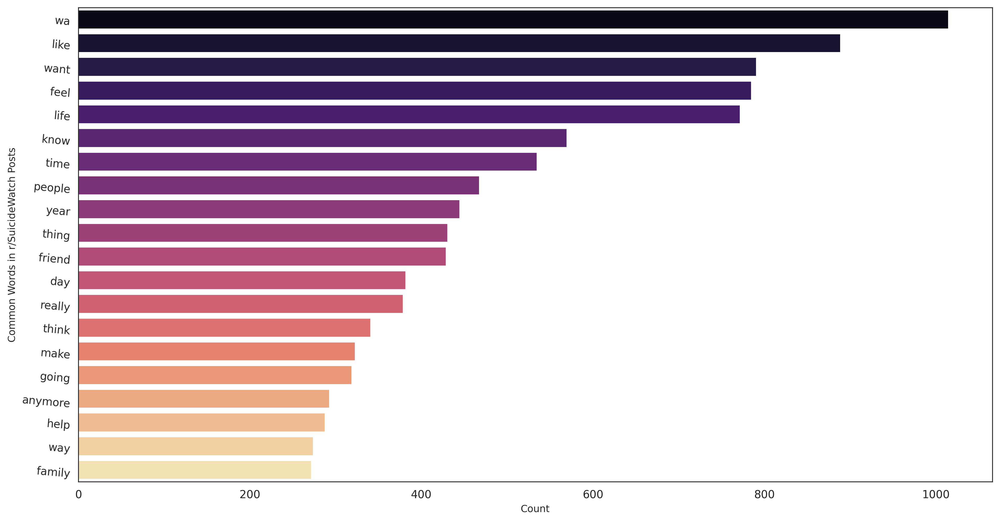

In [32]:
plot_most_used_words("r/SuicideWatch Posts", suicide_posts, palette="magma", image_mask="./assets/suicide_mask.png")

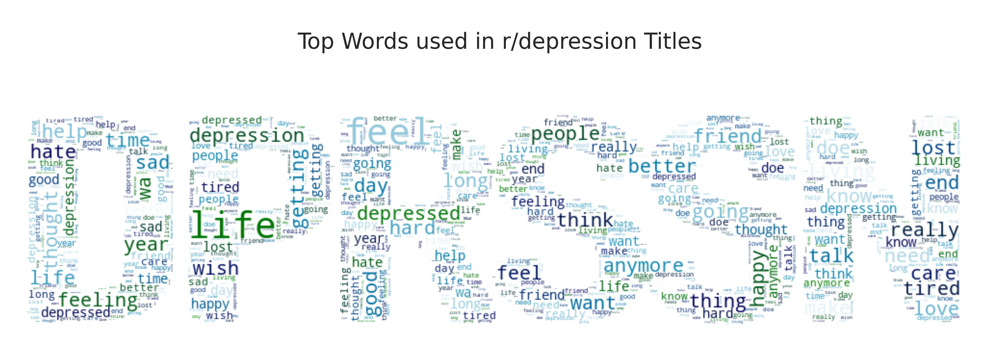

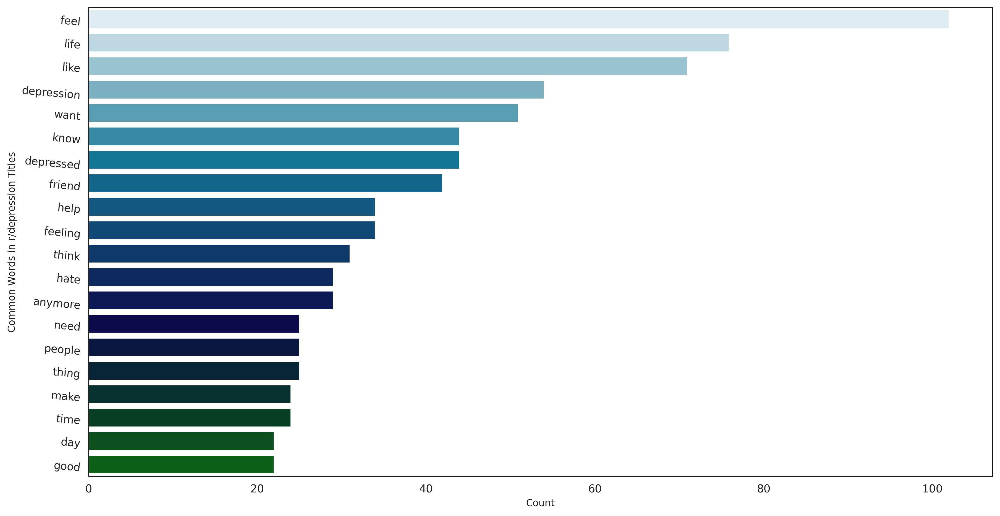

In [33]:
plot_most_used_words("r/depression Titles", depression_titles, palette="ocean_r", image_mask="./assets/depression_mask.png")

In [41]:
engine.execute("SELECT COUNT(*) from combined_cleaned WHERE title LIKE '%depression%'").fetchall()

[(63,)]

In [42]:
engine.execute("SELECT COUNT(*) from combined_cleaned WHERE title LIKE '%hate%'").fetchall()

[(50,)]

In [43]:
engine.execute("SELECT COUNT(*) from combined_cleaned WHERE title LIKE '%friend%'").fetchall()

[(74,)]

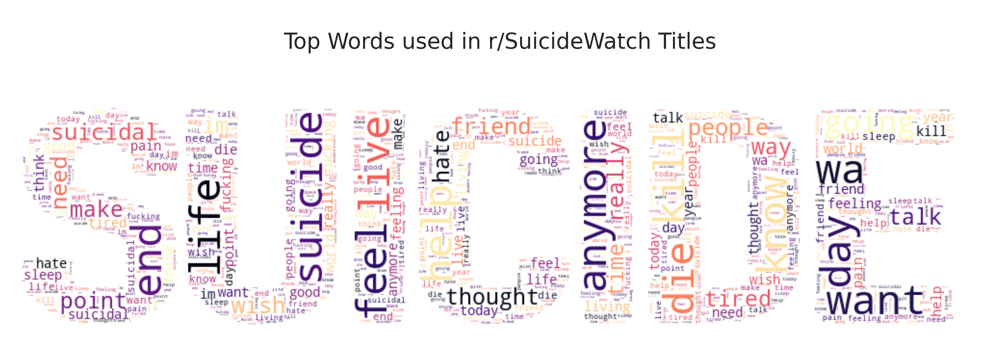

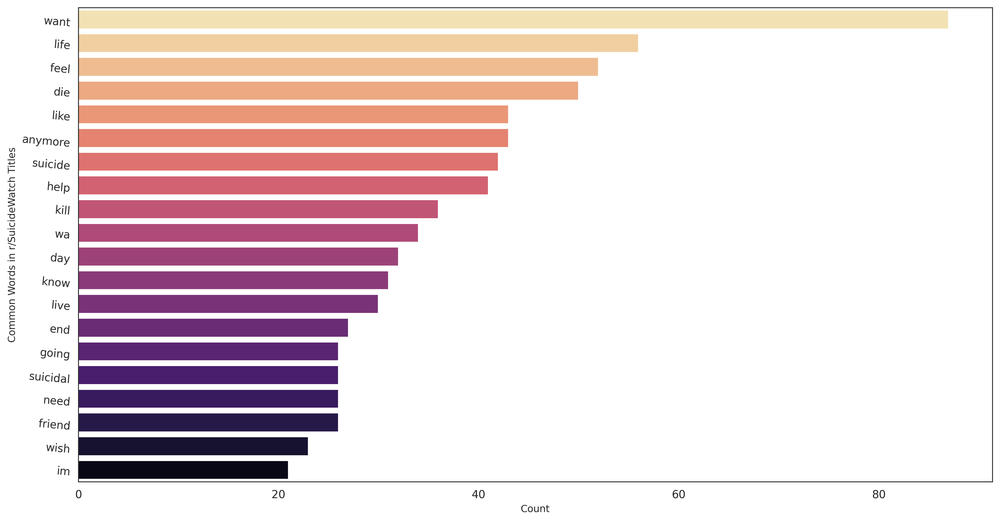

In [34]:
plot_most_used_words("r/SuicideWatch Titles", suicide_titles, palette="magma_r", image_mask="./assets/suicide_mask.png")

In [38]:
engine.execute("SELECT COUNT(*) from combined_cleaned WHERE title LIKE '%want%'").fetchall()

[(142,)]

In [39]:
engine.execute("SELECT COUNT(*) from combined_cleaned WHERE title LIKE '%life%'").fetchall()

[(127,)]

In [40]:
engine.execute("SELECT COUNT(*) from combined_cleaned WHERE title LIKE '%suicidal%'").fetchall()

[(36,)]

In [44]:
#13 authors have 420 in their name
engine.execute("SELECT COUNT(*) from combined_cleaned WHERE author LIKE '%420%'").fetchall()

[(13,)]

In [48]:
#people who have posted more than once
engine.execute("SELECT author, COUNT(*) from combined_cleaned \
               GROUP BY author\
               HAVING count(*) > 1\
               ORDER BY count(*) DESC").fetchall()

[('AnotherTrowaway12', 9),
 ('tangentnexus', 7),
 ('Faithfulservant12378', 7),
 ('[deleted]', 6),
 ('AdamskiKurwaMaster', 6),
 ('SomeWh1teDood', 5),
 ('Ok_Independent1821', 5),
 ('lavenderhopeless', 4),
 ('kgoing8', 4),
 ('justnoone90', 4),
 ('jjeris', 4),
 ('ihatedanx100', 4),
 ('fokingintrovert23', 4),
 ('VoyagingVulture', 4),
 ('SuperDooperDpressed', 4),
 ('SQLwitch', 4),
 ('Patrick_Basedman69', 4),
 ('Existing5678', 4),
 ('wildcaughtmind', 3),
 ('what_isthis_', 3),
 ('userisntimportant', 3),
 ('throwaway182027', 3),
 ('shootalolz', 3),
 ('rainloading', 3),
 ('notanonlyfans', 3),
 ('kycxkyuf', 3),
 ('expired81', 3),
 ('beastmodebro5', 3),
 ('an_man101', 3),
 ('alice_and_cheshire', 3),
 ('ThatWasNotEasy10', 3),
 ('Smallcutewolf', 3),
 ('SharpedoB', 3),
 ('PewDiePie610', 3),
 ('Particular_Tiger1123', 3),
 ('No_Refrigerator_2545', 3),
 ('No_End_7227', 3),
 ('JuanaLoveU', 3),
 ('DustGremlin', 3),
 ('Dainaz2021', 3),
 ('Beautiful_Ad_3208', 3),
 ('Bayek3087', 3),
 ('BadCaseOfBrainShakes',

In [49]:
engine.execute("SELECT selftext from combined_cleaned WHERE author LIKE '%AnotherTrowaway12%'").fetchall()

[('Those are the thoughts that run through my head, that I’m worthless and deserve to die',),
 ('I’m talking to myself because I feel so lonely',),
 ('I want to die',),
 ('I just feel so down, I don’t want to deal with life!',),
 ('I’m not good enough for my parents, I’m not good enough for school, I’m not good enough for anything. My employer for my new job literally said to me ... (317 characters truncated) ... oyer kept mentioning someone else who was coming tommorow, this was more of a test they’ll probably kick me out once they realize who worthless I am.',),
 ('My moodswings, chest pains, panic attacks, personality disorders. The world will forever see me as a freak. The only time they don’t is when I act like I’m normal and play guitar, then they give fake smiles and validation, but why do I always have to prove myself then?',),
 ('I just need someone, anyone. Please help',),
 ('I try to but I just end up as a burden. Maybe I should just give up ; (',),
 ('emptypost',)]

In [51]:
engine.execute("SELECT title from combined_cleaned WHERE author LIKE '%AnotherTrowaway12%'").fetchall()

[('Is it true that I’m worthless and that everyone hates me?',),
 ('I need someone to talk to ; (',),
 ('I just can’t take it anymore ; (',),
 ('Help I need support ; (',),
 ('I want to kill myself because I’ll never be good enough!',),
 ('I want to die!',),
 ('I need someone to talk to I’m feeling suicidal',),
 ('I’m sick of reaching out for help ; (',),
 ('I need help ; (',)]

In [50]:
engine.execute("SELECT selftext from combined_cleaned WHERE author LIKE '%tangentnexus%'").fetchall()

[("i keep posting on reddit thinking it will somehow help. it doesn't.  at least it hasn't been.\n\njust now, i walked back to my computer from my kitch ... (197 characters truncated) ... ill to live.  i sleep all day and have nightmares.\n\ni don't know what to do.  i'm in mental pain all of the time.  i can't take it.  i can't think.",),
 ("the same circular suicidal thoughts day after day.  crying when i start a task.  loneliness every single day.  this is hell.  this pain won't stop.  i try and attempt to change my perspective and thinking process.  it never seems to help.  i can't seem to help myself.  i feel empty.",),
 ("every.  single.  day.  wake up and feel utter dread.  i want to be dead.  nap and wake up wanting to be dead.  most sleep is filled with nightmares.\n\nalone.  always alone.\n\ni can't live.\n\nthere is no relief.",),
 ("i have no plans with anyone.  i have no plans for myself.  i can't get relief from feeling lonely.  i can't stop feeling like i don't want to e

In [52]:
engine.execute("SELECT title from combined_cleaned WHERE author LIKE '%tangentnexus%'").fetchall()

[('no job, no relationship (gf), no life',),
 ('always empty and alone',),
 ('there is no relief',),
 ('not well',),
 ('tired of everything',),
 ('lost hope',),
 ("i can't keep living with constant mental pain",)]

In [53]:
engine.execute("SELECT avg(length(title)) from combined_cleaned").fetchall()

[(39.726856561546285,)]

In [54]:
engine.execute("SELECT avg(length(selftext)) from combined_cleaned").fetchall()

[(813.4862665310275,)]

In [55]:
engine.execute("SELECT avg(length(author)) from combined_cleaned").fetchall()

[(12.921668362156664,)]

In [56]:
combined_data['selftext_length'] = [len(combined_data['selftext'][i]) for i in range(len(combined_data))]

In [57]:
combined_data['title_length'] = [len(combined_data['title'][i]) for i in range(len(combined_data))]

In [58]:
avg_length_depression_title = combined_data['title_length'][combined_data['is_suicide'] == 0].mean()
avg_length_depression_posts = combined_data['selftext_length'][combined_data['is_suicide'] == 0].mean()
avg_length_suicide_title = combined_data['title_length'][combined_data['is_suicide'] == 1].mean()
avg_length_suicide_posts = combined_data['selftext_length'][combined_data['is_suicide'] == 1].mean()

In [59]:
print("Average length of a r/depression title: {}".format(avg_length_depression_title))
print("Average length of a r/SuicideWatch title: {}".format(avg_length_suicide_title))
print("Average length of a r/depression post: {}".format(avg_length_depression_posts))
print("Average length of a r/SuicideWatch post: {}".format(avg_length_suicide_posts))

Average length of a r/depression title: 40.488821138211385
Average length of a r/SuicideWatch title: 38.96334012219959
Average length of a r/depression post: 878.1168699186992
Average length of a r/SuicideWatch post: 748.724032586558


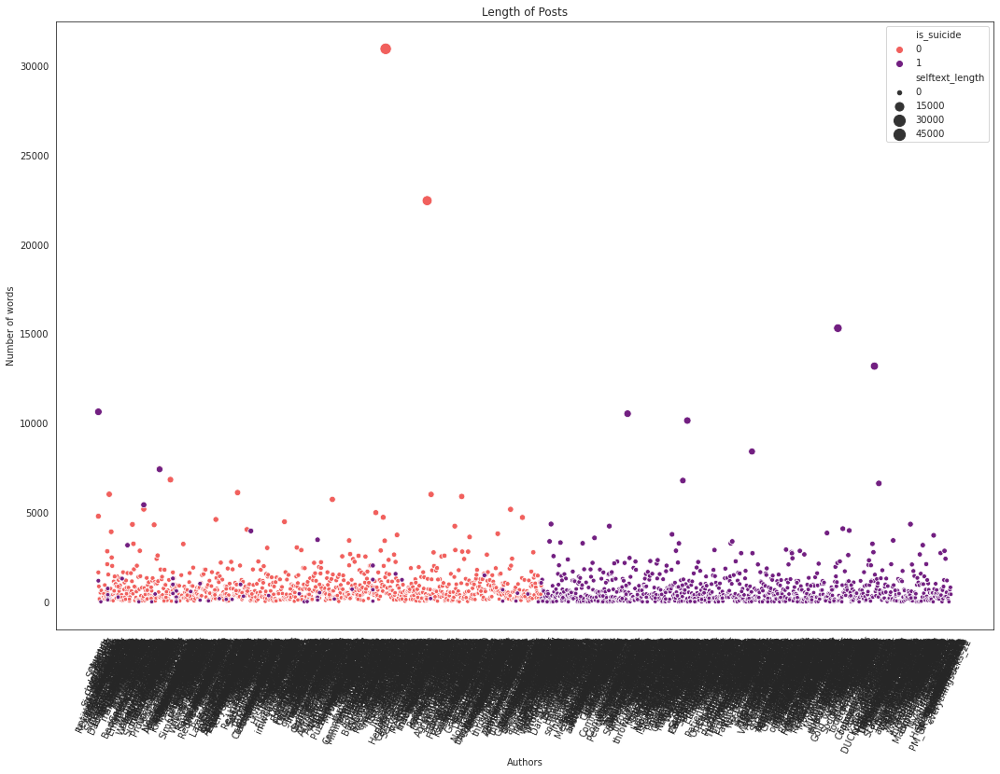

In [60]:
#CREATING A SCATTERPLOT TO VISUALISE LENGTH OF POSTS
sns.set_style("white")
plt.figure(figsize = (18, 12))
sns.scatterplot(data =combined_data,
               y = "selftext_length", 
               x = "author",
               hue = 'is_suicide', 
               palette = "magma_r",
               size = 'selftext_length',
               sizes=(20, 150));
plt.title("Length of Posts");
plt.xlabel("Authors");
plt.ylabel("Number of words");
plt.xticks(rotation=65);

In [61]:
combined_data.to_csv('./data/data_for_prediction.csv', index = False)